Some work to try and work out how to best stitch together different scans

In [1]:
import NavigatingTheMatrix as nvm
import numpy as np
from matplotlib import pyplot as plt
from pathlib import Path
import os
import cv2
from scipy.stats import mode
from copy import deepcopy
import importlib 
import As_detection as asd
from collections import deque
import networkx as nx

from icecream import ic

from scipy import signal

c:\Users\nkolev\OneDrive - University College London\Documents\GitHub\NavigatingTheMatrix\As_detection.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_

In [61]:
# Load 2 scans that we know have an overlap

# load desired matrix file and make an STM object from NavigatingTheMatrix file
cwd = Path.cwd() # current working directory

#path1 = cwd / 'hainault_examples' / '20200212-183707_Hainault-Si(001)-H--38_1.Z_mtrx'
path2 = cwd / 'hainault_examples' / '20200212-183707_Hainault-Si(001)-H--54_1.Z_mtrx'

#mtrx_scan1 = nvm.STM( str(path1) , None, None, None, standard_pix_ratio=512/100)
mtrx_scan2 = nvm.STM( str(path2) , None, None, None, standard_pix_ratio=1024/100) 

Pixel to nm ratio is 38pixels for every 100nm in the  trace down
trace down scan was interupted before completion. It will not be used.
Pixel to nm ratio is 38pixels for every 100nm in the  retrace down
retrace down scan was interupted before completion. It will not be used.


In [7]:
# clean up the scans

mtrx_scan1.clean_up(mtrx_scan1.trace_up, 'trace up', plane_level=True)
mtrx_scan1.clean_up(mtrx_scan1.retrace_up, 'retrace up', plane_level=True)

mtrx_scan1.clean_up(mtrx_scan1.trace_down, 'trace down', plane_level=True)
mtrx_scan1.clean_up(mtrx_scan1.retrace_down, 'retrace down', plane_level=True)

In [62]:
mtrx_scan2.clean_up(mtrx_scan2.trace_up, 'trace up', plane_level=True)
mtrx_scan2.clean_up(mtrx_scan2.retrace_up, 'retrace up', plane_level=True)


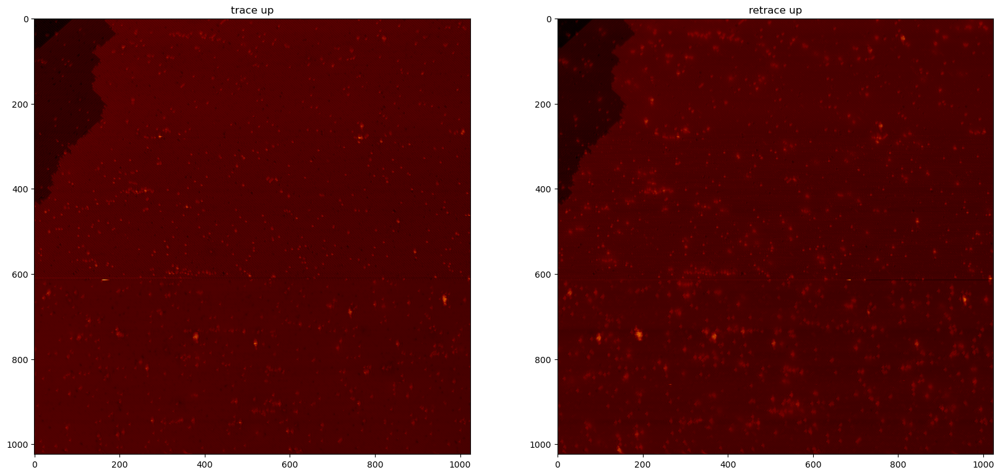

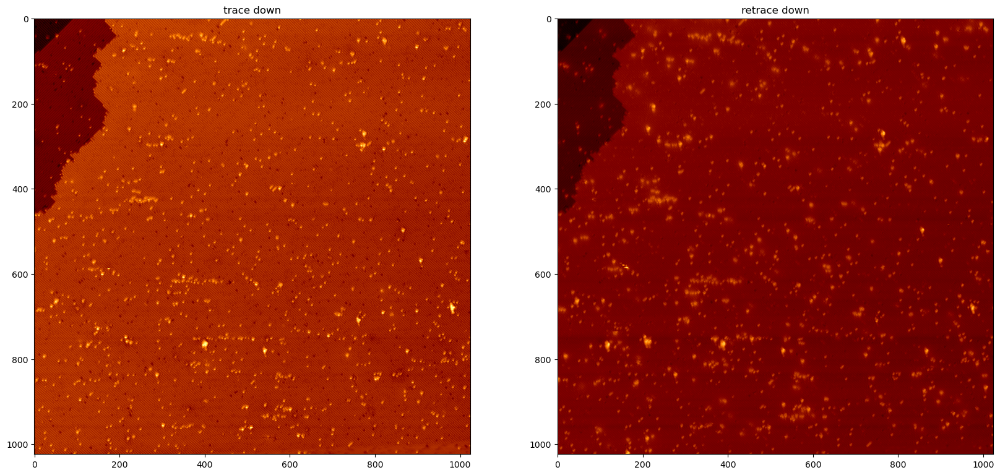

In [9]:
# plot the cleaned up scans and choose whether to use trace up or down
# (Viewing with gwyddion provides better quality images for inspection in my opinion)

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(mtrx_scan1.trace_up_proc, cmap='afmhot')
ax[0].set_title('trace up')
ax[1].imshow(mtrx_scan1.retrace_up_proc, cmap='afmhot')
ax[1].set_title('retrace up')
plt.show()

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(mtrx_scan1.trace_down_proc, cmap='afmhot')
ax[0].set_title('trace down')
ax[1].imshow(mtrx_scan1.retrace_down_proc, cmap='afmhot')
ax[1].set_title('retrace down')
plt.show()

In [67]:
n = 1
#scan1 = mtrx_scan1.trace_down_proc[::n,::n]
scan2 = mtrx_scan2.trace_up_proc#[:512,180:180+512]
scan2 = scan2[::n,::n]
#scan3 = mtrx_scan1.trace_down_proc[150:150+512,50:50+512]
#scan4 = mtrx_scan1.trace_down_proc[512:1024,:512]
#scan5 = mtrx_scan1.trace_down_proc[400:400+512,300:300+512]



In [2]:
# make a dictoinary of the scans you want to stitch

scans = {}

dir_path = r'C:\Users\nkolev\OneDrive - University College London\Desktop\mtrx\2022-10-06'

# Loop through the files in the directory and open the ones that are 63_1 to 99_1
# loading all 36 scans takes 10 minutes... so just load 10 for now.
# use a pair of ints as the key. There are 6X6 scans in total in this ~1um square
# each pair of ints corresponds to a scan in an intuitive way. (0,0) is the bottom left scan, (5,5) is the top right scan etc
for filename in os.listdir(dir_path):
    if filename[-8:] == '1.Z_mtrx':
        scan_number = int(filename[-11:-9])
        if scan_number<98 and scan_number>61:
            file_path = os.path.join(dir_path, filename)
            if os.path.isfile(file_path):
                # Add the file to the dictionary
                n = scan_number-62
                n1 = n//6
                n2 = n%6
                scan_dict = {'file': file_path, 
                             'standard_pix_ratio': 512/100
                             }
                scans[(n1,n2)] = nvm.STM( scan_dict )


In [3]:
# load the large overview scan

overview_path = r'C:\Users\nkolev\OneDrive - University College London\Desktop\mtrx\2022-10-10\20221010-161204_India-Si(001)-H-STM_AtomManipulation--7_3.Z_mtrx'

overview = nvm.STM( overview_path , None, None, None, standard_pix_ratio=512/1000)


Pixel to nm ratio is 1pixels for every 1000nm in the  trace down
trace down scan was interupted before completion. It will not be used.
Pixel to nm ratio is 1pixels for every 1000nm in the  retrace down
retrace down scan was interupted before completion. It will not be used.


In [162]:
# clean up the overview scan

overview.clean_up(overview.retrace_up, 'retrace up', plane_level=True)

In [3]:
# tidy up the scans (trace up only)

i =  0
for scan in scans.values():
    scan.clean_up(scan.trace_up, 'trace up', plane_level=True)
    scan.clean_up(scan.retrace_up, 'retrace up', plane_level=True)
    scan.clean_up(scan.trace_down, 'trace down', plane_level=True)
    scan.clean_up(scan.retrace_down, 'retrace down', plane_level=True)


In [4]:
# correct hysterisis in the scans

for scan in scans.values():
    scan.trace_down_proc, scan.retrace_down_proc, corrected = scan.correct_hysteresis(scan.trace_down_proc, scan.retrace_down_proc, 'trace down')

Number of matches found for hysteresis correction: 106 . If it's only a few (less than ~3) the correction will not be very accurate.
Number of matches found for hysteresis correction: 191 . If it's only a few (less than ~3) the correction will not be very accurate.
Number of matches found for hysteresis correction: 69 . If it's only a few (less than ~3) the correction will not be very accurate.
Number of matches found for hysteresis correction: 67 . If it's only a few (less than ~3) the correction will not be very accurate.
Number of matches found for hysteresis correction: 138 . If it's only a few (less than ~3) the correction will not be very accurate.
Number of matches found for hysteresis correction: 71 . If it's only a few (less than ~3) the correction will not be very accurate.
Number of matches found for hysteresis correction: 66 . If it's only a few (less than ~3) the correction will not be very accurate.
Number of matches found for hysteresis correction: 210 . If it's only a f

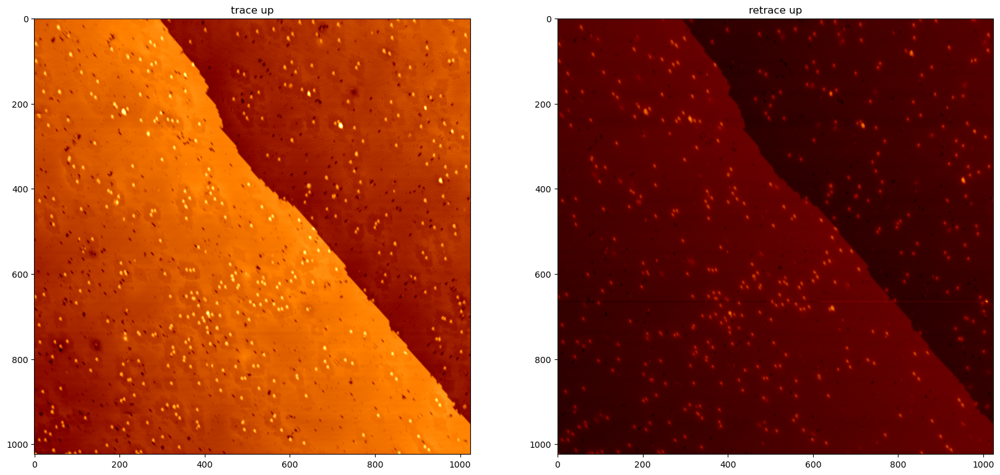

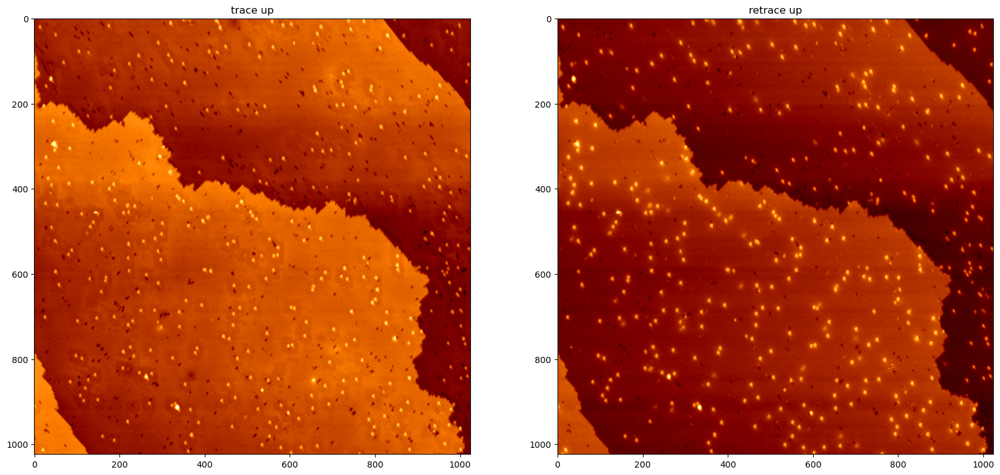

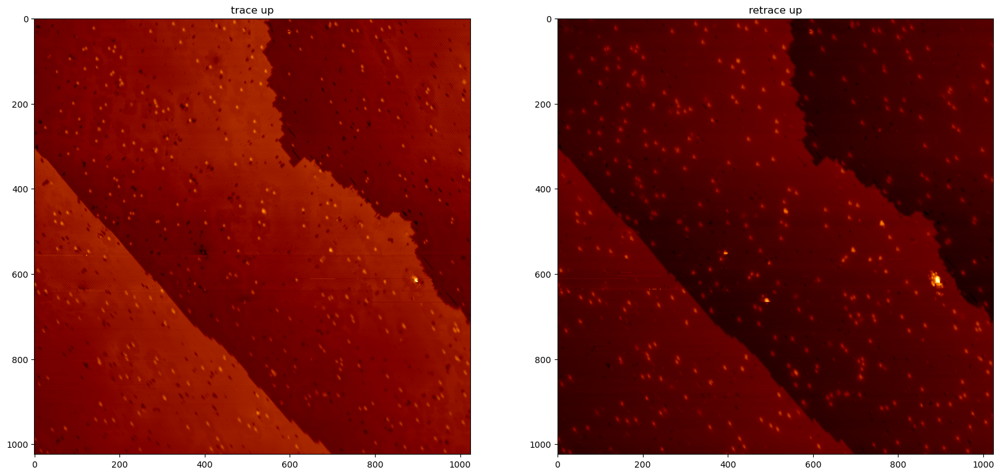

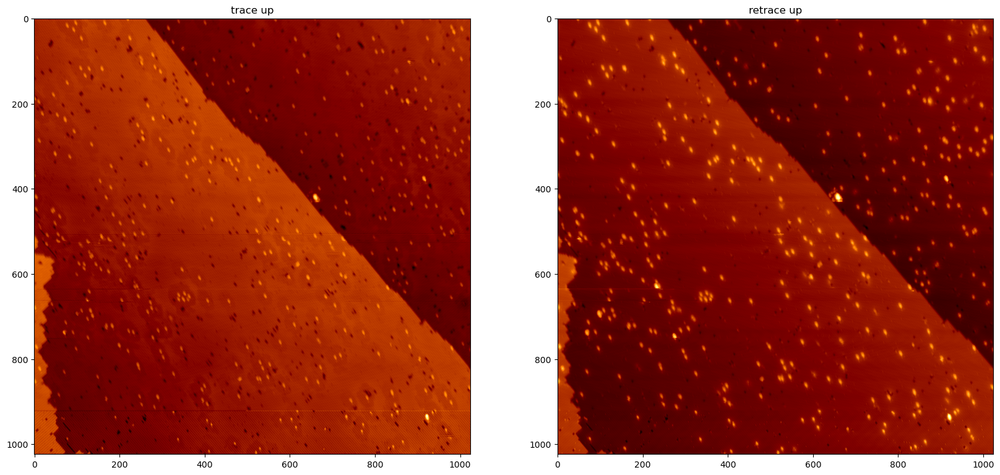

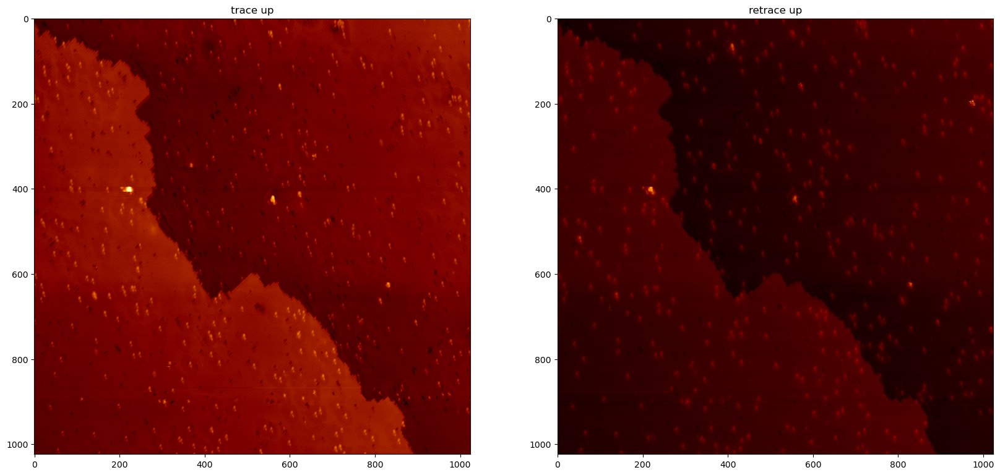

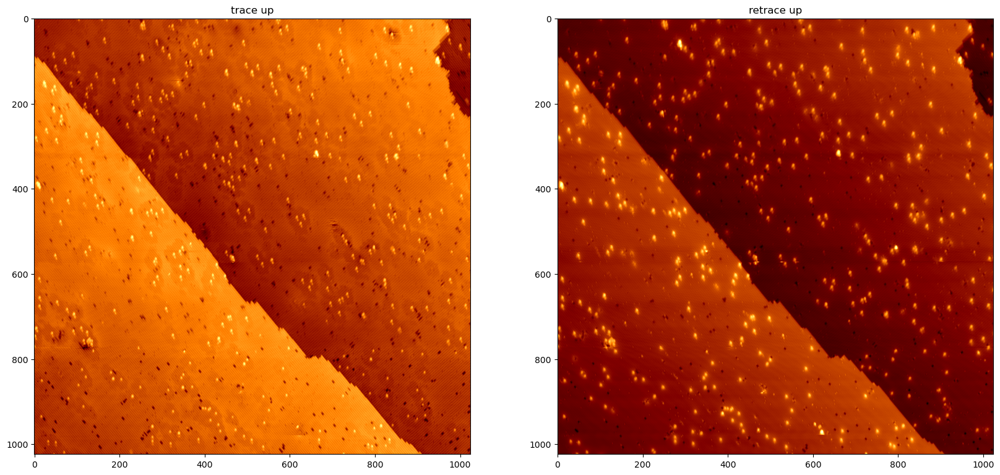

In [6]:
# plot a few to check they are all good

i=0
for key in scans.keys():
    if i<6:
        fig, ax = plt.subplots(1,2, figsize=(20,15))
        ax[0].imshow(scans[key].trace_down_proc, cmap='afmhot')
        ax[0].set_title('trace up')
        ax[1].imshow(scans[key].retrace_down_proc, cmap='afmhot')
        ax[1].set_title('retrace up')
        plt.show()
        i+=1

In [19]:
importlib.reload(asd)

<module 'As_detection' from 'c:\\Users\\nkolev\\OneDrive - University College London\\Documents\\GitHub\\NavigatingTheMatrix\\As_detection.py'>

In [7]:
# use the ML from asd on the scans

# make detector object to find and label defects
detector = asd.Detector()


In [8]:
# make a dict of the scans to use
segmented_scans = {}

for key, scan in scans.items():
    print(key)
    segmented_scans[key] = asd.Si_Scan(scan, 'trace down', As=False)
    segmented_scans[key].one_hot_segmented = detector.predict(segmented_scans[key])
    segmented_scans[key].rgb = detector.turn_rgb(segmented_scans[key].one_hot_segmented)

(0, 0)
Resolution of image is 1024 by 1024
Number of features is 481
(0, 1)
Resolution of image is 1024 by 1024
Number of features is 411
(0, 2)
Resolution of image is 1024 by 1024
Number of features is 461
(0, 3)
Resolution of image is 1024 by 1024
Number of features is 472
(0, 4)
Resolution of image is 1024 by 1024
Number of features is 776
(0, 5)
Resolution of image is 1024 by 1024
Number of features is 626
(1, 0)
Resolution of image is 1024 by 1024
Number of features is 517
(1, 1)
Resolution of image is 1024 by 1024
Number of features is 2204
(1, 2)
Resolution of image is 1024 by 1024
Number of features is 717
(1, 3)
Resolution of image is 1024 by 1024
Number of features is 505
(1, 4)
Resolution of image is 1024 by 1024
Number of features is 997
(1, 5)
Resolution of image is 1024 by 1024
Number of features is 2110
(2, 0)
Resolution of image is 1024 by 1024
Number of features is 916
(2, 1)
Resolution of image is 1024 by 1024
Number of features is 1502
(2, 2)
Resolution of image is 1

In [7]:
# ideas on how to improve:
# 1) implement a cross-checker on the flann matcher
# 3) Pretend scans are jumbled up and you don't know their order. For each scan find top n scans that seem to overlap, and then get their homography matrix. 
#    Then do checks on these homogpraphy matrices to see if they make sense (e.g conserve orientation, scale etc)
# 4) Could use some of the real physical information we have to make it more accurate. E.g. we know the scans are of the same area.
#    We technically know the rough translation between the scans.
# 5) Try MSC on the translations to get rid of the bad ones.

def find_homography(img1, img2, threshold = 1, algorithm = 'SIFT', show_plot = False):
    '''
    Finds the homography matrix needed to align scan1 and scan2. 
    It first find common points between the two scans using SIFT, then uses RANSAC to get rid of the bad matches 
    and find the homography matrix.

    Args:
    img1 (numpy.ndarray): First scan. If one scans smaller than the other (in nm), this should be the smaller scan for better results.
    img2 (numpy.ndarray): Second scan
    threshold (float): Threshold for the Lowe's ratio test. Default is 0.8
    show_plot (bool): Whether to plot the matches and the homography transformation
    algorithm (str): Which algorithm to use for feature matching. 'SIFT' or 'AKAZE' only
    
    returns:
    H (numpy.ndarray): Homography matrix
    mask (numpy.ndarray): Mask of inliers
    '''

    # max/min normalise the images
    img1 = (img1 - np.min(img1))/(np.max(img1)-np.min(img1))
    img2 = (img2 - np.min(img2))/(np.max(img2)-np.min(img2))

    # change their resolution to the same
   # if img1.shape != img2.shape:
   #     img1 = cv2.resize(img1, (img2.shape[1], img2.shape[0]))
                                     
    # we need to use the OpenCV SIFT algorithm which needs the scan in a certain format
    sift_scan1 = cv2.normalize(img1, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    sift_scan2 = cv2.normalize(img2, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

    if algorithm == 'SIFT':
        # Create SIFT object
        sift = cv2.SIFT_create(contrastThreshold=0.00001, edgeThreshold=10000) 
        #sift = cv2.SIFT_create()#contrastThreshold=01, edgeThreshold=10000) 
       
        # Find keypoints and descriptors
        kp1, des1 = sift.detectAndCompute(sift_scan1, None)
        kp2, des2 = sift.detectAndCompute(sift_scan2, None)

        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=10)
        search_params = dict(checks=50)
        
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches1to2 = flann.knnMatch(des1, des2, k=2)
        matches2to1 = flann.knnMatch(des2, des1, k=2)

    elif algorithm == 'AKAZE':
        # Create AKAZE object
        akaze = cv2.AKAZE_create()
        # Find keypoints and descriptors
        kp1, des1 = akaze.detectAndCompute(sift_scan1, None)
        kp2, des2 = akaze.detectAndCompute(sift_scan2, None)
        
        matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_BRUTEFORCE_HAMMING)
        matches1to2 = matcher.knnMatch(des1, des2, k=2)
        matches2to1 = matcher.knnMatch(des2, des1, k=2)
    
    else: 
        raise ValueError('algorithm should be either SIFT or AKAZE')

    # First filter: store all the good matches as per Lowe's ratio test
    good1to2 = []
    for m, n in matches1to2:
        if m.distance < threshold * n.distance:
            good1to2.append(m)

    good2to1 = []
    for m, n in matches2to1:
        if m.distance < threshold * n.distance:
            good2to1.append(m)

    # Cross-check: keep only matches that appear in both directions
    good = []
    for m1 in good1to2:
        for m2 in good2to1:
            if m1.queryIdx == m2.trainIdx and m1.trainIdx == m2.queryIdx:
                good.append(m1)
                break

    # draw matches
    #if show_plot:
    #    plot = cv2.drawMatches(sift_scan1, kp1, sift_scan2, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    #    plt.imshow(plot, cmap='afmhot')
    #    plt.title('All matches')
    #    plt.show()

    # first filter
    # store all the good matches as per Lowe's ratio test.
    # i.e. each match has two points its matched with. If the second point is much further than the first
    # (in terms of their feature vectors), then the first match isn't ambiguous and should be kept.
  #  good = []
  #  for m,n in matches:
  #      good.append(m)

    # draw matches
    if show_plot:
        plot = cv2.drawMatches(sift_scan1, kp1, sift_scan2, kp2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        plt.imshow(plot, cmap='afmhot')
        plt.title('All matches')
        plt.show()

  #  good = []
  #  for m,n in matches:
  #      if m.distance < threshold*n.distance:
  #          good.append(m)


    # Second filter: check the translation between the scans given by each match. 
    # Find matches that give similar translations (around 5 or 10 pixels difference in each direction)
    translations = {}
    for m in good:  
        x1, y1 = kp1[m.queryIdx].pt
        x2, y2 = kp2[m.trainIdx].pt
        trans = [(x1-x2),(y1-y2)]
        translations[m] = trans
    #print(len(good))
    # delete matches that don't have a similar translation to any other matches
    array_trans = np.array(list(translations.values()))
    for m, trans in translations.items():
        d_trans = np.abs( array_trans - trans )
        # find number of translations within 10 pixels
        n_tenpix = np.sum(d_trans < 20, axis = 1)
        n_tenpix = np.sum(n_tenpix == 2)
        if n_tenpix < 10: 
            good.remove(m) 

    # draw matches
    if show_plot:
        plot = cv2.drawMatches(sift_scan1, kp1, sift_scan2, kp2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        plt.imshow(plot, cmap='afmhot')
        plt.title('Clusters of matches with similar translations')
        plt.show()
 
    # find keypoints in image 2 that have multiple matches in image 1 and keep only the best one
    repeated_kps = {}
    for m in good:
        if m.trainIdx not in repeated_kps:
            repeated_kps[m.trainIdx] = [m]
        else:
            repeated_kps[m.trainIdx].append(m)
    
    # Sort the repeated_kps and keep only the best match
    for k, v in repeated_kps.items():
        repeated_kps[k] = sorted(v, key=lambda x: x.distance)

    # Remove all but the best match
    unique_good = []
    for k, v in repeated_kps.items():
        unique_good.append(v[0])  # Keep only the best match
    
    if len(unique_good)<4:
        print("Not enough matches found to compute homography matrix")
        return("Not enough matches found to compute homography matrix")

    # use Ransac to get rid of more bad matches
    src_pts = np.float32([kp1[m.queryIdx].pt for m in unique_good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in unique_good]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransacReprojThreshold=1, maxIters=5000, confidence = 0.995)

    matchesMask = mask.ravel().tolist()

    h,w = sift_scan1.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,H)
    if show_plot:
        plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
        draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)
        plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, unique_good ,None,**draw_params)
        plt.imshow(plot3, cmap='afmhot'), plt.title('First homography matches'), plt.show()

    ###########################################
    # Now we have a homography matrix let's do some tests on it and the matches it uses
    # to try and get a more accurate one.

    # delete any matches that give a translation that's very different from the mode
    H, trans_mask, translation_good = translation_check(H, mask, unique_good.copy(), kp1, kp2, matchesMask)
    trans_matchesMask = trans_mask.ravel().tolist()
    if show_plot:
        plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
        draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = trans_matchesMask, # draw only inliers
                   flags = 2)
        plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, translation_good, None,**draw_params)
        plt.imshow(plot3, cmap='afmhot'), plt.title('Homography matches'), plt.show()


    '''
# NOTE: HOW DOES DELETING MATCHES FROM THE MATCHES LIST AFFECT THE MASK?

    # now carry out some tests on the homography matrix to see if it makes sense
    # it should conserve orientation (scan should not be mirrored)
    # rotation should be no more than 30 degrees (hand picked parameter, could change)
    
    # orientation
    # determinant of top left 2x2 matrix should be positive
    det = (H[0,0]*H[1,1])-(H[0,1]*H[1,0])
    ic(det)
    while det<=0:
        # remove the matches that were used for this homography and calculate it again
        ids = np.where(np.array(matchesMask)==0)[0].astype(int)
        unique_good = list(np.array(unique_good)[ids])
        
        if len(unique_good)<4: # check there's still enough matches to find matrix
            print("Not enough matches found to compute homography matrix")
            return("Not enough matches found to compute homography matrix")
        
        # recalculate the homography matrix
        src_pts = np.float32([kp1[m.queryIdx].pt for m in unique_good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in unique_good]).reshape(-1, 1, 2)
        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5, confidence = 0.995)
        matchesMask = mask.ravel().tolist()
        # delete any matches that give a translation that's very different from the mode
       # H, trans_mask, translation_good = translation_check(H, mask, unique_good.copy(), kp1, kp2, matchesMask)
        det = (H[0,0]*H[1,1])-(H[0,1]*H[1,0])
        ic(det)
        #trans_matchesMask = trans_mask.ravel().tolist()
        if show_plot:
            plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
            draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
            plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, good, None,**draw_params)
            plt.imshow(plot3, cmap='afmhot'), plt.title('Homography matches'), plt.show()
    
    # rotation
    # take 2 points and see how much they are rotated
    # if the rotation is more than 30 degrees, then the homography matrix is probably wrong
    point1 = np.array([0,1,1])
    point2 = np.array([0,0,1])
    point1_rot = np.dot(H,point1)
    point2_rot = np.dot(H,point2)
    vec = point1[:2]-point2[:2]
    vec_rot = point1_rot[:2] - point2_rot[:2]
    # find angle between vec and vec_rot
    angle = np.arccos(np.dot(vec, vec_rot)/(np.linalg.norm(vec)*np.linalg.norm(vec_rot)))
    angle = np.degrees(angle)
    ic(angle)
    while angle>20 or angle<-20:
        # get rid of the matches that were used for this homography and calculate it again
        ids = np.where(np.array(matchesMask)==0)[0].astype(int)
        unique_good = list(np.array(unique_good)[ids])

        if len(unique_good)<4:
            print("Not enough matches found to compute homography matrix")
            return("Not enough matches found to compute homography matrix")
        
        # recalculate the homography matrix
        src_pts = np.float32([kp1[m.queryIdx].pt for m in unique_good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in unique_good]).reshape(-1, 1, 2)
        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5, confidence = 0.995)
        # delete any matches that give a translation that's very different from the mode
       # H, trans_mask, translation_good = translation_check(H, mask, unique_good.copy(), kp1, kp2, matchesMask)
      #  trans_matchesMask = mask.ravel().tolist()
        point1_rot = np.dot(H,point1)
        point2_rot = np.dot(H,point2)
        vec_rot = point1_rot[:2] - point2_rot[:2]
        angle = np.arccos(np.dot(vec, vec_rot)/(np.linalg.norm(vec)*np.linalg.norm(vec_rot)))
        angle = np.degrees(angle)
        ic(angle)
        if show_plot:
            plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
            draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
            plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, good, None,**draw_params)
            plt.imshow(plot3, cmap='afmhot'), plt.title('Homography matches'), plt.show()
    
    if show_plot:
        plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
        draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)
        plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, unique_good ,None,**draw_params)
        plt.imshow(plot3, cmap='afmhot'), plt.title('Final homography matches'), plt.show()

    '''
    return H, mask

(0, 5) (0, 6)
(1, 0) (1, 1)


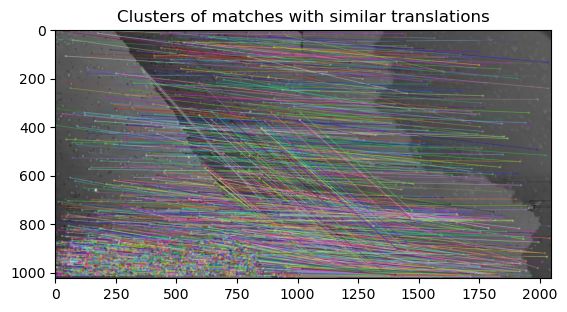

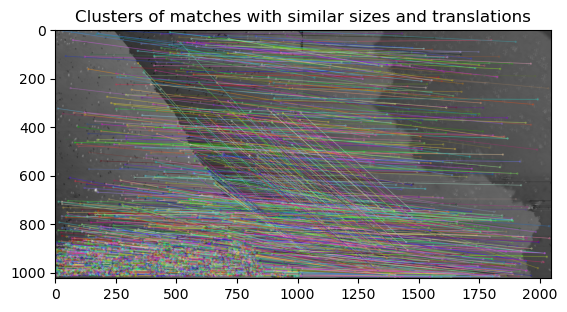

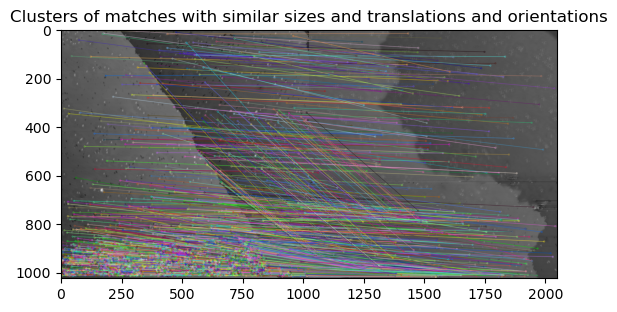

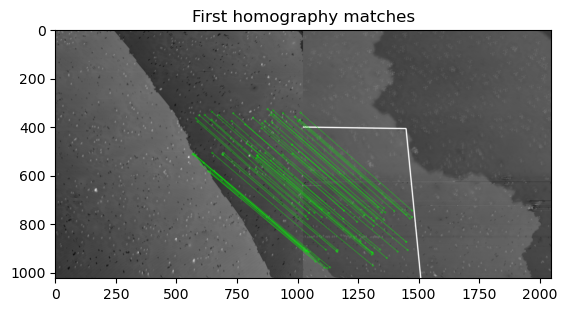

2


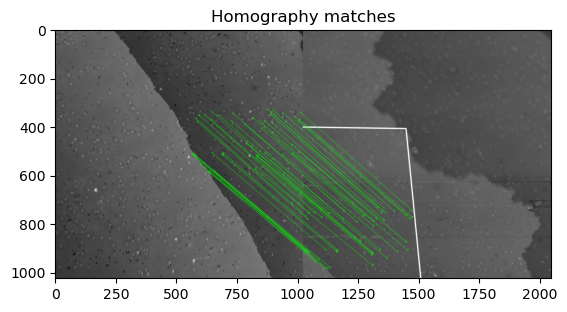

In [390]:
# Find overlaps and homography matrices. Start with (0,0) and (0,1), then (0,2) etc

homographies = {}

i=0
for key, scan in scans.items():
    if i==5:
        neighbour_key = (key[0], key[1]+1)
        print(key, neighbour_key)
        if neighbour_key[1]>5:
            continue
        if neighbour_key not in scans:
            continue
        neighbour = scans[neighbour_key]
        homographies[(key, neighbour_key)] = find_homography(scan.trace_up_proc, neighbour.trace_up_proc, threshold=1, show_plot=True)
    i+=1
#    if i==1:
#        break 

In [50]:
# ideas on how to improve:
# 3) Pretend scans are jumbled up and you don't know their order. For each scan find top n scans that seem to overlap, and then get their homography matrix. 
#    Then do checks on these homogpraphy matrices to see if they make sense (e.g conserve orientation, scale etc)
# 4) Could use some of the real physical information we have to make it more accurate. E.g. we know the scans are of the same area.
#    We technically know the rough translation between the scans.
# 5) Try MSC on the translations to get rid of the bad ones.
# 6) Correct the hysterisis in the scans. Then can use the fwd and bwd scans to get a more accurate homography matrix.
# 7) add in more filters but do it using numpy arrays so it's still quick.

class scan_stitcher(object):
    '''
    A class used to stitch together STM scans.

    Attributes:


    Methods:
    find_homography: Finds the homography matrix needed to align scan1 and scan2.
    stitch_two_scans: Stitches together two images using the homography matrix.
    '''

    def __init__(self):
        pass

    def find_homography(self, img1, img2, show_plot = False, round_to = 10, counts1=5, counts2=5):
        '''
        Finds the homography matrix needed to align scan1 and scan2. 
        It first find common points between the two scans using SIFT, then uses RANSAC to get rid of the bad matches 
        and find the homography matrix.

        Args:
        img1 (numpy.ndarray): First scan. If one scans smaller than the other (in nm), this should be the smaller scan for better results.
        img2 (numpy.ndarray): Second scan
        show_plot (bool): Whether to plot the matches and the homography transformation
        counts2 (int): The number of common translations needed to keep a match for second round of filtering
        round_to (int): The number to round the translations to. Default is 10
        counts1 (int): The number of common translations needed to keep a match for the first round of filtering

        returns:
        H (numpy.ndarray): Homography matrix
        mask (numpy.ndarray): Mask of inliers
        '''

        channels = sum([[img1[:,:,i],img2[:,:,i]] for i in range(len(img1.shape[2]))], [])

        # max/min normalise the images. They are 3D arrays so we need to do this for each channel
        channels = [(channel - np.min(channel))/(np.max(channel)-np.min(channel)) for channel in channels]
                                        
        # we need to use the OpenCV SIFT algorithm which needs the scan in a certain format
        sift_channels = [cv2.normalize(channel, None, 0, 255, cv2.NORM_MINMAX).astype('uint8') for channel in channels]

        # Create SIFT object
        sift = cv2.SIFT_create(contrastThreshold=0.00001, edgeThreshold=10000) 
    
        # Find keypoints and descriptors
        kps_descs = [sift.detectAndCompute(channel, None) for channel in sift_channels]

        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=10)
        search_params = dict(checks=50)
        
        # Find matches between channel1 of img1 and channel1 of img2, then channel2 of img1 and channel2 of img2 etc
        # but not of channel1 of img1 and channel2 of img2 etc
        # could add this later if not enough matches generated
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches_list = []
        for i in range(0, len(kps_descs),2):
            kp1, desc1 = kps_descs[i]
            kp2, desc2 = kps_descs[i+1]
            matches1to2 = flann.knnMatch(desc1, desc2, k=2)
            matches2to1 = flann.knnMatch(desc2, desc1, k=2)
            matches_list.append(matches1to2)
            matches_list.append(matches2to1)

        # First filter: round translations to nearest 'round_to' and only keep matches that have 
        # the same (rounded) translation to at least 'counts1' other matches
        good_arrs = []
        translations_list = []
        most_common_trans_list = []
        for i, matches in enumerate(matches_list):
            if i%2==0:
                kp1, desc1 = kps_descs[i]
                kp2, desc2 = kps_descs[i+1]
            else:
                kp2, desc2 = kps_descs[i]
                kp1, desc1 = kps_descs[i-1]
            good_arr, translations, most_common_trans = self.translation_filter(matches, kp1, kp2, round_to, counts2)
            good_arrs.append(good_arr)
            translations_list.append(translations)
            most_common_trans_list.append(most_common_trans)

        if all(most_common_trans.size == 0 for most_common_trans in most_common_trans_list):
            print("No common points found between the two scans")
            return None
        
        # delete any matches that don't have a similar translation to any other matches
        for i, most_common_trans in enumerate(most_common_trans_list):
            top_matches_list = [(good_arrs[i][np.sum(translations_list[i] == trans,axis=1)==2, :].tolist() for trans in most_common_trans)]
        
        # plot matches 
        if show_plot:
            for i in range(len(top_matches_list)):
                if i%2==0:
                    plot = cv2.drawMatches(sift_channels[i], kps_descs[i][0], sift_channels[i+1], kps_descs[i+1][0], top_matches_list[i], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
                    plt.imshow(plot, cmap='afmhot')
                    plt.title('Clusters of matches with similar translations')
                    plt.show()
                else:
                    plot = cv2.drawMatches(sift_channels[i], kps_descs[i][0], sift_channels[i-1], kps_descs[i-1][0], top_matches_list[i], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
                    plt.imshow(plot, cmap='afmhot')
                    plt.title('Clusters of matches with similar translations')
                    plt.show()


        # Convert matches any matches that aren't from img1, channel1 -> img2,channl1 into img1, channel1 -> img2, channel1  
        # we also need two lists of all the keypoints. One for img1 and one for img2. (All keypoints from all channels in img1 
        # become keypoints of img1, channel1 etc)
        kp1 = []
        kp2 = []
        good = top_matches_list[0] # first set is img1, channel1 -> img2, channel1
        # now convert the rest of the matches
        for i, top_matches in enumerate(1, top_matches_list):
            if i%2==0:
                good += [ cv2.DMatch(_queryIdx=m.queryIdx + len(kp1), _trainIdx=m.trainIdx + len(kp2),
                                     _imgIdx=m.imgIdx, _distance=m.distance) for m in top_matches]
            else:
                good += [ cv2.DMatch(_queryIdx=m.trainIdx + len(kp2), _trainIdx=m.queryIdx + len(kp1),
                                     _imgIdx=m.imgIdx, _distance=m.distance) for m in top_matches]
                kp1 += kps_descs[i-1][0]
                kp2 += kps_descs[i][0]

        # now filter with translations for second time. This time we use counts2 to filter and 
        # it can be more strict (i.e. higher) as we should have more 'true' matches               
        good_arr, translations, most_common_trans = self.translation_filter(good, kp1, kp2, round_to, counts2)
        
        # delete any matches that don't have a similar translation to any other matches
        good = sum( [good_arr[ np.sum( translations == trans, axis=1) ==2, :].tolist() for trans in most_common_trans], [] ) 
        
        if len(good)<4:
            print("Not enough matches found to compute homography matrix")
            return None
        
        # draw matches
        if show_plot:
            plot = cv2.drawMatches(sift_channels[0], kp1, sift_channels[1], kp2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            plt.imshow(plot, cmap='afmhot')
            plt.title('Clusters of matches with similar translations')
            plt.show()
        
        # find keypoints in image 2 that have multiple matches in image 1 and keep only the best one
        repeated_kps = {}
        for m in good:
            if m.trainIdx not in repeated_kps:
                repeated_kps[m.trainIdx] = [m]
            else:
                repeated_kps[m.trainIdx].append(m)
        
        # Sort the repeated_kps
        for k, v in repeated_kps.items():
            repeated_kps[k] = sorted(v, key=lambda x: x.distance)

        # Remove all but the best match
        unique_good = []
        for k, v in repeated_kps.items():
            unique_good.append(v[0])  # Keep only the best match
        
        if len(unique_good)<4:
            print("Not enough matches found to compute homography matrix")
            return None

        # use Ransac to get rid of more bad matches
        src_pts = np.float32([kp1[m.queryIdx].pt for m in unique_good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in unique_good]).reshape(-1, 1, 2)

        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransacReprojThreshold=1, maxIters=5000, confidence = 0.995)
        matchesMask = mask.ravel().tolist()

        h,w = sift_channels[0].shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        dst = cv2.perspectiveTransform(pts,H)
        if show_plot:
            plot2 = cv2.polylines(np.copy(sift_channels[1]),[np.int32(dst)],True,255,3, cv2.LINE_AA)
            draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
            plot3 = cv2.drawMatches(sift_channels[0], kp1, plot2, kp2, unique_good ,None,**draw_params)
            plt.imshow(plot3, cmap='afmhot'), plt.title('Homography matches'), plt.show()

        if H is None:
            print("Homography matrix not found")
            return None

        ###########################################
        # Now we have a homography matrix let's do some tests on it to make sure it's valid
        valid = self.check_homography(H, mask, unique_good, kp1, kp2, show_plot)

        if valid:
            return H, mask
        print("Homography matrix not valid")
        return None
    
    def check_homography(self, H, channel):
        '''
        Checks to see if homography matrix is valid.
        It should coserve orientation, not rotate too much and not change the size of the image too much.
        Args:
        H (numpy.ndarray): Homography matrix
        channel: Channel to be transformed

        returns:
        valid (bool): Whether the homography matrix is valid or not
        '''

        # it should conserve orientation (scan should not be mirrored) (det>0)
        det = (H[0,0]*H[1,1])-(H[0,1]*H[1,0])
        if det<=0:
            print("Homography matrix does not conserve orientation")
            return False
        
        # rotation should be no more than 20 degrees (hand picked parameter, could change)
        point1 = np.array([0,1,1])
        point2 = np.array([0,0,1])
        point1_rot = np.dot(H,point1)
        point2_rot = np.dot(H,point2)
        vec = point1[:2]-point2[:2]
        vec_rot = point1_rot[:2] - point2_rot[:2]
        # find angle between vec and vec_rot
        angle = np.arccos(np.dot(vec, vec_rot)/(np.linalg.norm(vec)*np.linalg.norm(vec_rot)))
        angle = np.degrees(angle)
        if angle>20 or angle<-20:
            print("Homography matrix isn't valid (rotates too much).")
            return False
        
        # size shouldn't change by too much
        # +30% or -30% max 
        # Get the dimensions of the images
        h2, w2 = channel.shape[:2]
        # Get the canvas dimensions
        pts_channel = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
        pts_channel_transformed = cv2.perspectiveTransform(pts_channel, H)
        # check the size of the transformed image
        [xmin, ymin] = np.int32(pts_channel_transformed.min(axis=0).ravel() - 0.5)
        [xmax, ymax] = np.int32(pts_channel_transformed.max(axis=0).ravel() + 0.5)
        area_original = h2*w2
        area_transformed = (xmax-xmin)*(ymax-ymin)
        if area_transformed>1.3*area_original or area_transformed<0.7*area_original:
            print("Homography matrix isn't valid (changes size too much).")
            return False

        return True


    def translation_filter(self, matches, kp1, kp2, round_to = 10, counts_thresh=4):
        '''
        Filters out matches that have a translation that aren't in a cluster of similar translations
        Args:
        matches (list): List of matches
        kp1 (list): List of keypoints from the first channel
        kp2 (list): List of keypoints from the second channel
        counts_thresh (int): The number of common translations needed to keep a match
        round_to (int): The number to round the translations to. Default is 10

        returns:
        good_arr (numpy.ndarray): Array of matches
        translations (numpy.ndarray): Array of translations
        most_common_trans (list): List of translations that appear more than counts_thresh times
        '''
        
        good_arr = np.array([ [m, m.distance, m.trainIdx, m.queryIdx, kp2[m.trainIdx].pt[0], kp2[m.trainIdx].pt[1], kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1]] for m in matches])
        # find translations
        translations = ((good_arr[:,4:6] - good_arr[:,6:])/round_to).astype(np.float64).round()*round_to
        # find top m translations and only keep those matches
        unique_points, counts = np.unique(translations, axis=0, return_counts=True)
        # Find the indices of the translations that appear more than 10 times
        most_common_indices = np.where(counts>counts_thresh)
        # Get the most common tranlsations
        most_common_trans = unique_points[most_common_indices]
        
        return good_arr, translations, most_common_trans

    def stitch_two_scans(self, img1, img2, H):
        '''
        Stitches together two images using the homography matrix.

        Args:
        img1 (numpy.ndarray): First scan. If one scans smaller than the other (in nm), this should be the smaller scan for better results.
        img2 (numpy.ndarray): Second scan
        H (numpy.ndarray): Homography matrix

        returns:
        result_img (numpy.ndarray): The stitched image
        H_translation (numpy.ndarray): The translation matrix
        '''
        # change their resolution to the same
        # Get the dimensions of the images
        h1, w1 = img1.shape[:2]
        h2, w2 = img2.shape[:2]
        #print(h1,w1,h2,w2) # seems fine
        # Get the canvas dimensions
        pts_img1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
        pts_img2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)

        pts_img2_transformed = cv2.perspectiveTransform(pts_img2, H)
        #print(pts_img2_transformed)
        pts = np.concatenate((pts_img1, pts_img2_transformed), axis=0)
        [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
        [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)

        # Translation matrix to shift the image
        translation_dist = [-xmin, -ymin]
        H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])
    # print(xmax - xmin, ymax - ymin)
        # Warp the second image
        result_img = cv2.warpPerspective(img2, H_translation.dot(H), (xmax - xmin, ymax - ymin))
        #final = np.zeros(result_img.shape)
        #final[translation_dist[1]:translation_dist[1] + h1, translation_dist[0]:translation_dist[0] + w1] = img1
        #final[:h2, xmax-xmin-w2:] = result_img[:h2, xmax-xmin-w2:]
        # Overlay the second image on top of the warped first image
        mask = (img1 == 0)
        result_img[translation_dist[1]:translation_dist[1] + h1, translation_dist[0]:translation_dist[0] + w1] = result_img[translation_dist[1]:translation_dist[1] + h1, translation_dist[0]:translation_dist[0] + w1]*mask + img1

        plt.imshow(result_img, cmap='afmhot')
        plt.title('Stitched image')
        plt.show()

        return result_img, H_translation

    def stitch_scans(self, scans, trace = 'trace up', round_to = 10, counts1=5, counts2=5):
        '''
        Stitches together a dictionary of scans. Starts by finding the homography matrix between the first two scans, then
        stitches the second scan to the first, then find homography matrix between the stitched scan and the third then stitches
        them together and so on.

        Args:
        scans (dict): Dictionary of scans with the keys being the row and column number of the scans and the values being the scans themselves.
                      The scans should be stm scan objects. What is row and column number? Imagine we split the total image into an nxn grid with n being
                      the number of scans taken in x and y direction. Then the row and column number is the position of the scan in this grid.
        trace (str): Which trace to use for the stitching. One of 'trace up', 'trace down', 'retrace up' or 'retrace down'. Default is 'trace up'.
        
        Returns:
        stitched_scan (numpy.ndarray): The stitched scans
        '''
        
        # make a dictionary of the scans with the key being the row and column number of the scan
        # and the value being the scan itself as a numpy array
        scans_np = {}
        for key, scan in scans.items():
            if trace == 'trace up':
                if scan.trace_up_proc is None:
                    print("No processed trace up found for scan", key)
                else:
                    scans_np[key] = scan.trace_up_proc
            elif trace == 'trace down':
                if scan.trace_down_proc is None:
                    print("No processed trace down found for scan", key)
                else:
                    scans_np[key] = scan.trace_down_proc
            elif trace == 'retrace up':
                if scan.retrace_up_proc is None:
                    print("No processed retrace up found for scan", key)
                else:
                    scans_np[key] = scan.retrace_up_proc
            elif trace == 'retrace down':
                if scan.retrace_down_proc is None:
                    print("No processed retrace down found for scan", key)
                else:
                    scans_np[key] = scan.retrace_down_proc

        stitched_scan = scans_np[(0,0)]
        homographies = {} # store the homography matrices between each scan
        translations = {} # store the translation between each scan
        # for each scan, find the homography matrix between it and all it's neighbours before moving on to the next scan
        added_scans = [(0,0)]
        for key, scan in scans_np.items():
            neighbour_keys = [(key[0]+1, key[1]), (key[0], key[1]+1), (key[0]-1, key[1]), (key[0], key[1]-1), (key[0]+1, key[1]+1), (key[0]-1, key[1]-1), (key[0]+1, key[1]-1), (key[0]-1, key[1]+1)]
            for neighbour_key in neighbour_keys:
                print(key, neighbour_key)
                if neighbour_key not in scans_np:
                    continue
                if neighbour_key in added_scans:
                    continue
                neighbour = scans_np[neighbour_key]
                # get homography
                H_mask = self.find_homography(stitched_scan, neighbour, threshold=1, show_plot=True, round_to = round_to, counts1 = counts1, counts2=counts2)
                if H_mask is None:
                    print("No homography matrix found between", key, "and", neighbour_key)
                    prompt = input("Do you want to continue? y/n")
                    if prompt == 'n':
                        return stitched_scan
                    else:
                        continue
                else:
                    homographies[(key, neighbour_key)] = np.linalg.inv(H_mask[0])
                # find full homography matrix for this scan by multiplying the homography matrices between it and (0,0)
                # find which matrices it needs
                # matrices = []

                # stitch the old stitched scan with the new scan
                stitched_scan, translations[(key,neighbour_key)] = self.stitch_two_scans(stitched_scan, neighbour, homographies[(key, neighbour_key)])
                added_scans.append(neighbour_key)
        

        return stitched_scan
        


In [94]:
# ideas for improvement:
# 1) Split the matches into clusters, then find different homographies for each cluster
#    (plus one from all the clusters combined) and then use the one that gives the best result
#    (best being smallest size change, rotation within 20 degrees, no orientation change).

class segmented_scan_stitcher(object):
    '''
    A class used to stitch together STM scans.

    Attributes:


    Methods:
    find_homography: Finds the homography matrix needed to align scan1 and scan2.
    stitch_two_scans: Stitches together two images using the homography matrix.
    '''

    def __init__(self):
        pass

    def find_homography(self, img1, img2, show_plot = False, round_to = 10, counts1=5, counts2=5):
        '''
        Finds the homography matrix needed to align scan1 and scan2. 
        It first find common points between the two scans using SIFT, then uses RANSAC to get rid of the bad matches 
        and find the homography matrix.

        Args:
        img1 (numpy.ndarray): First scan. If one scans smaller than the other (in nm), this should be the smaller scan for better results.
        img2 (numpy.ndarray): Second scan
        show_plot (bool): Whether to plot the matches and the homography transformation
        counts2 (int): The number of common translations needed to keep a match for second round of filtering
        round_to (int): The number to round the translations to. Default is 10
        counts1 (int): The number of common translations needed to keep a match for the first round of filtering

        returns:
        H (numpy.ndarray): Homography matrix
        mask (numpy.ndarray): Mask of inliers
        '''

        channels = sum([[img1[:,:,i],img2[:,:,i]] for i in range(img1.shape[2])], [])

        # max/min normalise the images. They are 3D arrays so we need to do this for each channel
        channels = [(channel - np.min(channel))/(np.max(channel)-np.min(channel)) for channel in channels]
                                        
        # we need to use the OpenCV SIFT algorithm which needs the scan in a certain format
        sift_channels = [cv2.normalize(channel, None, 0, 255, cv2.NORM_MINMAX).astype('uint8') for channel in channels]

        # Create SIFT object
        sift = cv2.SIFT_create(contrastThreshold=0.00001, edgeThreshold=10000) 
    
        # Find keypoints and descriptors
        kps_descs = [sift.detectAndCompute(channel, None) for channel in sift_channels]

        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=10)
        search_params = dict(checks=50)
        
        # Find matches between channel1 of img1 and channel1 of img2, then channel2 of img1 and channel2 of img2 etc
        # but not of channel1 of img1 and channel2 of img2 etc
        # could add this later if not enough matches generated
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches_list = []
        matches_arrs = []
        translations_list = []
        most_common_trans_list = []
        for i in range(len(kps_descs)):
            if i%2==0:
                k = i+1
            else:
                k = i-1
            kp1, desc1 = kps_descs[i]
            kp2, desc2 = kps_descs[k]
            matches = flann.knnMatch(desc1, desc2, k=1)
            matches_list.append([m[0] for m in matches])
            #  First filter: round translations to nearest 'round_to' and only keep matches that have 
            # the same (rounded) translation to at least 'counts1' other matches
            matches_arr, translations, most_common_trans = self.translation_filter(matches_list[-1], kp1, kp2, round_to, counts2)
            matches_arrs.append(matches_arr)
            translations_list.append(translations)
            most_common_trans_list.append(most_common_trans)

        if all(most_common_trans.size == 0 for most_common_trans in most_common_trans_list):
            print("No common points found between the two scans")
            return None
        
        top_matches_list = []
        #np.sum([np.sum(translations_list_i == trans,axis=1)==2 for trans in most_common_trans_i], axis=0)
        # delete any matches that don't have a similar translation to any other matches
        for i, most_common_trans in enumerate(most_common_trans_list):
            indices = [np.sum(translations_list[i] == trans, axis=1) == 2 for trans in most_common_trans] 
            indices = np.where(np.sum(indices, axis=0)==1)
            top_matches_list.append( matches_arrs[i][:,0][indices].tolist() )

        # plot matches 
        if show_plot:
            for i, top_matches in enumerate(top_matches_list):
                if i<2:
                    if i%2==0:
                        k = i+1
                    else:
                        k = i-1
                    plot = cv2.drawMatches(sift_channels[i], kps_descs[i][0], sift_channels[k], kps_descs[k][0], top_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
                    plt.imshow(plot, cmap='afmhot')
                    plt.title('Clusters of matches with similar translations')
                    plt.show()
                    
        # Convert matches any matches that aren't from img1, channel1 -> img2,channl1 into img1, channel1 -> img2, channel1  
        # we also need two lists of all the keypoints. One for img1 and one for img2. (All keypoints from all channels in img1 
        # become keypoints of img1, channel1 etc)
        kp1 = []
        kp2 = []
        good = top_matches_list[0] # first set is img1, channel1 -> img2, channel1
        # now convert the rest of the matches
        for i, top_matches in enumerate(top_matches_list):
            if i == 0:
                continue
            if i%2==0:
                good += [ cv2.DMatch(_queryIdx=m.queryIdx + len(kp1), _trainIdx=m.trainIdx + len(kp2),
                                     _imgIdx=m.imgIdx, _distance=m.distance) for m in top_matches]
            else:
                good += [ cv2.DMatch(_queryIdx=m.trainIdx + len(kp1), _trainIdx=m.queryIdx + len(kp2),
                                     _imgIdx=m.imgIdx, _distance=m.distance) for m in top_matches]
                kp1 += kps_descs[i-1][0]
                kp2 += kps_descs[i][0]
       
        # now filter with translations for second time. This time we use counts2 to filter and 
        # it can be more strict (i.e. higher) as we should have more 'true' matches               
        good_arr, translations, most_common_trans = self.translation_filter(good, kp1, kp2, round_to, counts2)
        
        indices = [np.sum(translations == trans, axis=1) == 2 for trans in most_common_trans] 
        indices = np.where(np.sum(indices, axis=0)==1)
        good = good_arr[:,0][indices].tolist()
       
        if len(good)<4:
            print("Not enough matches found to compute homography matrix")
            return None
        
        # find keypoints in image 2 that have multiple matches in image 1 and keep only the best one
        repeated_kps = {}
        for m in good:
            if m.trainIdx not in repeated_kps:
                repeated_kps[m.trainIdx] = [m]
            else:
                repeated_kps[m.trainIdx].append(m)
        
        # Sort the repeated_kps
        for k, v in repeated_kps.items():
            repeated_kps[k] = sorted(v, key=lambda x: x.distance)

        # Remove all but the best match
        unique_good = []
        for k, v in repeated_kps.items():
            unique_good.append(v[0])  # Keep only the best match
        
        if len(unique_good)<4:
            print("Not enough matches found to compute homography matrix")
            return None

        # Now we find the homography matrix. To increase the chances of finding a good homography matrix,
        # we make 5 groups of keypoints and find the homography matrix for each group as well as for the total.
        # We then choose the homography matrix which changes the size of the image the least.            
        src_pts = np.float32([kp1[m.queryIdx].pt for m in unique_good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in unique_good]).reshape(-1, 1, 2)
        # split these points into 5 groups
        src_pts_split = np.array_split(src_pts, 5)
        dst_pts_split = np.array_split(dst_pts, 5)
        print('src_pts_split[0].shape: ', src_pts_split[0].shape)
        print('dst_pts_split[0].shape: ', dst_pts_split[0].shape)
        # lists of Hs, homography types, size changes
        # homography type is either 'full' or 'trans' meaning only translation
        Hs, H_types, size_changes = [], [], []
        for i in range(5):
            H, mask = cv2.findHomography(src_pts_split[i], dst_pts_split[i], cv2.RANSAC, ransacReprojThreshold=1, maxIters=5000, confidence = 0.995)
            valid = self.check_homography(H, channels[1])
            if not valid:
                continue
            else:
                size_change = self._get_size_change(H, channels[1])
                size_changes.append(size_change)
                if valid[2] == 'full':
                    Hs.append(H)
                    H_types.append('full')
                elif valid[2] == 'trans':
                    translation = self._get_translation()

        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransacReprojThreshold=1, maxIters=5000, confidence = 0.995)
        matchesMask = mask.ravel().tolist()

        if H is None:
            print("Homography matrix not found")
            return None

        h,w = sift_channels[0].shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        dst = cv2.perspectiveTransform(pts,H)
        if show_plot:
            plot2 = cv2.polylines(np.copy(sift_channels[1]),[np.int32(dst)],True,255,3, cv2.LINE_AA)
            draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
            plot3 = cv2.drawMatches(sift_channels[0], kp1, plot2, kp2, unique_good ,None,**draw_params)
            plt.imshow(plot3, cmap='afmhot'), plt.title('Homography matches'), plt.show()

        ###########################################
        # Now we have a homography matrix let's do some tests on it to make sure it's valid
        valid = self.check_homography(H, channels[1])

        if not valid:
            #print("Homography matrix not valid")
            return None
        if len(valid)==3:
            return valid[1], mask, valid[2]
        
        return valid[1], mask

    def check_homography(self, H, channel):
        '''
        Checks to see if homography matrix is valid.
        It should coserve orientation, not rotate too much and not change the size of the image too much.
        Args:
        H (numpy.ndarray): Homography matrix
        channel: Channel to be transformed

        returns:
        valid (bool): Whether the homography matrix is valid or not
        '''

        # it should conserve orientation (scan should not be mirrored) (det>0)
        det = (H[0,0]*H[1,1])-(H[0,1]*H[1,0])
        if det<=0:
            print("Homography matrix does not conserve orientation")
            return False
        
        # rotation should be no more than 20 degrees (hand picked parameter, could change)
        angle = self._get_rotation(H)
        if angle>20 or angle<-20:
            print("Homography matrix isn't valid (rotates too much).")
            return False
        
        # size shouldn't change by too much
        size_change = self._get_size_change(H, channel)
        print('size change = ', size_change)
        if size_change>1.7 or size_change<0.5:
            print("Homography matrix isn't valid (changes size too much).")
            return False
        elif size_change>1.05 or size_change<0.95:
            print("Homography matrix might not be valid (changes size too much). Keep only the translation part.")
            return True, H, 'trans'
        
        return True, H, 'full'

    def _get_rotation(self, H):
        '''
        Finds rotation angle from homography matrix.
        Args:
        H (numpy.ndarray): Homography matrix
        Returns:
        angle (float): The rotation angle
        '''
        point1 = np.array([0,1,1])
        point2 = np.array([0,0,1])
        point1_rot = np.dot(H,point1)
        point2_rot = np.dot(H,point2)
        vec = point1[:2]-point2[:2]
        vec_rot = point1_rot[:2] - point2_rot[:2]
        # find angle between vec and vec_rot
        angle = np.arccos(np.dot(vec, vec_rot)/(np.linalg.norm(vec)*np.linalg.norm(vec_rot)))
        angle = np.degrees(angle)
        return angle

    def _get_size_change(self, H, channel):
        '''
        Gets the size change due to the homography matrix.
        Args:
        H (numpy.ndarray): Homography matrix
        channel: Channel to be transformed
        Returns:
        size_change (float): The size change
        '''
        # size shouldn't change by too much
        # Get the dimensions of the images
        h2, w2 = channel.shape[:2]
        # Get the canvas dimensions
        pts_channel = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
        pts_channel_transformed = cv2.perspectiveTransform(pts_channel, H)
        # check the size of the transformed image
        [xmin, ymin] = np.int32(pts_channel_transformed.min(axis=0).ravel() - 0.5)
        [xmax, ymax] = np.int32(pts_channel_transformed.max(axis=0).ravel() + 0.5)
        area_original = h2*w2
        area_transformed = (xmax-xmin)*(ymax-ymin)
        size_change = area_transformed/area_original
        return size_change

    def _get_translation(self, matches, kp1, kp2):
        '''
        Finds average translation from matches.
        Args:
        matches (list): List of matches
        kp1 (list): List of keypoints from the first channel (query)
        kp2 (list): List of keypoints from the second channel (train)
        Returns:
        translation (numpy.ndarray): The translation in (x,y).
        '''
        translation = np.mean([np.array(kp2[m.trainIdx].pt) - np.array(kp1[m.queryIdx].pt) for m in matches], axis=0)
        return translation

    def translation_filter(self, matches, kp1, kp2, round_to = 10, counts_thresh=4):
        '''
        Filters out matches that have a translation that aren't in a cluster of similar translations
        Args:
        matches (list): List of matches
        kp1 (list): List of keypoints from the first channel
        kp2 (list): List of keypoints from the second channel
        counts_thresh (int): The number of common translations needed to keep a match
        round_to (int): The number to round the translations to. Default is 10

        returns:
        matches_arr (numpy.ndarray): Array of matches
        translations (numpy.ndarray): Array of translations
        most_common_trans (list): List of translations (np.ndarray) that appear more than counts_thresh times
        '''

        matches_arr = np.array([ [m, m.distance, m.trainIdx, m.queryIdx, kp2[m.trainIdx].pt[0], kp2[m.trainIdx].pt[1], kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1]] for m in matches])
        # find translations
        translations = ((matches_arr[:,4:6] - matches_arr[:,6:])/round_to).astype(np.float64).round()*round_to
        # find top m translations and only keep those matches
        unique_trans, counts = np.unique(translations, axis=0, return_counts=True)
        # Find the indices of the translations that appear more than counts_thresh times
        most_common_indices = np.where(counts>counts_thresh)
        # Get the most common tranlsations
        most_common_trans = unique_trans[most_common_indices]
        
        return matches_arr, translations, most_common_trans

    def get_frame_translation(self, H, array1, array2):
        '''
        Gets the translation from a homography matrix due to
        mismatch of the resolution of the two images, not just the 
        translation needed to align the two images (that is easily taken from the H matrix).
        Args:
        H (numpy.ndarray): Homography matrix
        array2 (numpy.ndarray): Image to be transformed
        returns:
        translation (numpy.ndarray): The translation
        '''
        # Get the dimensions of the images
        h1, w1 = array1.shape[:2]
        h2, w2 = array2.shape[:2]
        # Get the canvas dimensions
        pts_img1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
        pts_img2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)

        pts_img2_transformed = cv2.perspectiveTransform(pts_img2, H)
        #print(pts_img2_transformed)
        pts = np.concatenate((pts_img1, pts_img2_transformed), axis=0)
        [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
        [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)

        # Translation matrix to shift the image
        translation_dist = [-xmin, -ymin]
        H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])
        
        return H_translation

    def stitch_two_arrays(self, array1, array2, H):
        '''
        Stitches two arrays together using the homography matrix.
        args:
        array1 (numpy.ndarray): First array, can contain multiple channels
        array2 (numpy.ndarray): Second array, can contain multiple channels, but should be 
                                the same number of channels as array1
        H (numpy.ndarray): Homography matrix for the transformation of array2 to array1 coords.
        Returns:
        result_array (numpy.ndarray): The stitched array
        H_translation (numpy.ndarray): The translation matrix needed to shift the second array 
                                       before applying the H matrix
        full_mask (numpy.ndarray): A mask where the places where the first array is are 0 and 1 elsewhere
        '''
        # make both arrays have 0 as minimum
        array1 = (array1 - np.min(array1))/(np.max(array1)-np.min(array1))
        array2 = (array2 - np.min(array2))/(np.max(array1)-np.min(array1))
        # anything over 1 is set to 1
        array2[array2>1] = 1
        
        # Get the dimensions of the images
        h1, w1 = array1.shape[:2]
        h2, w2 = array2.shape[:2]

        # Get the canvas dimensions
        pts_img1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
        pts_img2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)

        pts_img2_transformed = cv2.perspectiveTransform(pts_img2, H)
      
        pts = np.concatenate((pts_img1, pts_img2_transformed), axis=0)
        [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
        [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)

        # Translation matrix to shift the image
        translation_dist = [-xmin, -ymin]
        H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])
        # Warp the second image
        result_array = cv2.warpPerspective(array2, H_translation.dot(H), (xmax - xmin, ymax - ymin))
        #result_array = cv2.warpPerspective(array2, H_t.dot(H), (xmax - xmin, ymax - ymin))
        #result_array = cv2.warpPerspective(array2, H, (xmax - xmin, ymax - ymin))
        print('translation dist', translation_dist)
        # Overlay the second image on top of the warped first image
        mask = (array1[:,:,0] == 0)
        result_array[translation_dist[1]:translation_dist[1] + h1, translation_dist[0]:translation_dist[0] + w1, :] = result_array[translation_dist[1]:translation_dist[1] + h1, translation_dist[0]:translation_dist[0] + w1,:]*np.expand_dims(mask, axis=-1) + array1

        full_mask = np.zeros(result_array.shape[:2])
        full_mask[translation_dist[1]:translation_dist[1] + h1, translation_dist[0]:translation_dist[0] + w1] = mask

        plt.imshow(result_array[:,:,0], cmap='afmhot')
        plt.title('Stitched image')
        plt.show()

        return result_array, H_translation, full_mask

    def stitch_two_scans(self, scan1, scan2, H):
        '''
        Stitches together two Si_scan objects using the homography matrix.

        Args:
        scan1 (Si_scan): First scan. If one scans smaller than the other (in nm), this should be the smaller scan for better results.
        scan2 (Si_scan): Second scan
        H (numpy.ndarray): Homography matrix

        returns:
        result_scan (numpy.ndarray): The stitched image
        H_translation (numpy.ndarray): The translation matrix
        '''
        
        # stitch together their channels
        traces1 = np.copy(scan1.scan)
        segmented1 = np.copy(scan1.rgb)
        onehotsegmented1 = np.copy(scan1.one_hot_segmented)
        channels1 = np.dstack([traces1, segmented1, onehotsegmented1])

        traces2 = np.copy(scan2.scan)
        segmented2 = np.copy(scan2.rgb)
        onehotsegmented2 = np.copy(scan2.one_hot_segmented)
        channels2 = np.dstack([traces2, segmented2, onehotsegmented2])

        stitched_channels, H_translation, full_mask = self.stitch_two_arrays(channels1, channels2, H)

        # divide the stitched channels back into their original channels and define the
        # scan dict to make the new Si_scan object. Also find new heights and widths
        # TODO: check this works next time you reload asd
        pix_to_nmx = scan1.width/scan1.xres
        pix_to_nmy = scan1.height/scan1.yres
      #  print('old res y: ', scan1.yres, 'old res x: ', scan1.xres)
      #  print('old height: ', scan1.height, 'old width: ', scan1.width)
      #  print('pix to nm y: ', pix_to_nmy, 'pix to nm x: ', pix_to_nmx)
        new_width = stitched_channels.shape[1] * pix_to_nmx
        new_height = stitched_channels.shape[0] * pix_to_nmy
      #  print('new height: ', new_height, 'new width: ', new_width)
        result_scan_dict = {'trace up': stitched_channels[:,:,0],
                            'retrace up': stitched_channels[:,:,1],
                            'width': new_width,
                            'height': new_height}
      #  print('new yres: ', stitched_channels.shape[0], 'new xres: ', stitched_channels.shape[1])
        
        # define a new STM object for the stitched scan
        stm_scan = nvm.STM(result_scan_dict, from_file=False)
        # it assumes the images are unprocessed, they already are so we just 
        # define the processed images the same as the 'unprocessed' ones
        # we choose trace up as it's irrelevant
        stm_scan.trace_up_proc = stm_scan.trace_up
        stm_scan.retrace_up_proc = stm_scan.retrace_up
        result_scan = asd.Si_Scan(stm_scan, 'trace up')
        result_scan.rgb = stitched_channels[:,:,2:5]
        result_scan.one_hot_segmented = stitched_channels[:,:,5:]

        # update locations of the defects
        new_defects = {key: [] for key in scan1.feature_coords}
        for scan in [scan1, scan2]:
            defects = []
            for key in scan.feature_coords.keys():
                if len(scan.feature_coords[key])>0:
                    coords = np.array([np.array(scan.feature_coords[key])[:,1], np.array(scan.feature_coords[key])[:,0]])
                    coords = np.vstack((coords, np.ones((1,coords.shape[1]))))
                    coords = np.dot(H_translation, coords).T
                    coords = np.round(coords[:,:2], 0).reshape(-1,2).astype(int)
                    if scan == scan2:
                        # only add defects not in the overlap
                        for key, coord in defects:
                            if full_mask[coord[1], coord[0]]==0:
                                new_defects[key].append((coord[1], coord[0]))
                    else:
                        for key, coord in defects:
                            new_defects[key].append((coord[1], coord[0]))
                else:
                    continue

        result_scan.feature_coords = new_defects

        # add these to a features dict
        for i, key in enumerate(result_scan.feature_coords.keys()):
            result_scan.features[i] = asd.Feature(result_scan, result_scan.feature_coords[key], key) 

        return result_scan, H_translation

    def stitch_scans(self, scans, round_to = 20, counts1=5, counts2=5):
        '''
        Stitches together a dictionary of scans. Starts by finding the homography matrix between the first two scans, then
        stitches the second scan to the first, then find homography matrix between the stitched scan and the third then stitches
        them together and so on.

        Args:
        scans (dict): Dictionary of scans with the keys being the row and column number of the scans and the values being the scans themselves.
                      The scans should be stm scan objects. What is row and column number? Imagine we split the total image into an nxn grid with n being
                      the number of scans taken in x and y direction. Then the row and column number is the position of the scan in this grid.
        trace (str): Which trace to use for the stitching. One of 'trace up', 'trace down', 'retrace up' or 'retrace down'. Default is 'trace up'.
        
        Returns:
        stitched_scan (numpy.ndarray): The stitched scans
        '''
        
        # make a dictionary of the scans arrays with the key being the row and column number of the scan
        # and the value being the scan itself as a numpy array
        scans_np = {}
        for key, scan in scans.items():
            all_channels = self._get_full_tensor(scan)[:,:,:8] # get channels up to different bright features
            # get the bright features all in one in case there's a scan without any of a certain bright feature
            bright = np.sum(scan.one_hot_segmented[:,:,2:], axis=2) 
            scans_np[key] = np.dstack((all_channels,bright))

        stitched_scan = scans[(0,0)]
        homographies = {} # store the homography matrices between each scan
        translations = {} # store the translation between each scan
        # for each scan, find the homography matrix between it and all it's neighbours before moving on to the next scan
        added_scans = [(0,0)]
        for key, scan in scans.items():
            neighbour_keys = [(key[0]+1, key[1]), (key[0], key[1]+1), (key[0]-1, key[1]), (key[0], key[1]-1), (key[0]+1, key[1]+1), (key[0]-1, key[1]-1), (key[0]+1, key[1]-1), (key[0]-1, key[1]+1)]
            for neighbour_key in neighbour_keys:
                print(key, neighbour_key)
                if neighbour_key not in scans_np:
                    continue
                if neighbour_key in added_scans:
                    continue
                neighbour = scans[neighbour_key]
                # get np arrays of stitched_scan and neighbour
                stitched_scan_np = self._get_full_tensor(stitched_scan)[:,:,:8]
                bright_stitched = np.sum(stitched_scan.one_hot_segmented[:,:,2:], axis=2)
                stitched_scan_np = np.dstack((stitched_scan_np, bright_stitched))
                neighbour_np = scans_np[neighbour_key]
                # get homography
                H_mask = self.find_homography(stitched_scan_np, neighbour_np, show_plot=True, round_to = round_to, counts1 = counts1, counts2=counts2)
                if H_mask is None:
                    print("No homography matrix found between", key, "and", neighbour_key)
                    prompt = input("Do you want to continue? y/n")
                    if prompt == 'n':
                        return stitched_scan
                    else:
                        continue
                else:
                    homographies[(key, neighbour_key)] = np.linalg.inv(H_mask[0])
                # find full homography matrix for this scan by multiplying the homography matrices between it and (0,0)
                # find which matrices it needs
                # matrices = []
                
                # stitch the old stitched scan with the new scan
                stitched_scan, translations[(key,neighbour_key)] = self.stitch_two_scans(stitched_scan, neighbour, homographies[(key, neighbour_key)])
                added_scans.append(neighbour_key)
        

        return stitched_scan
        
    def breadth_first_search(gself, graph, start, goal):
        """
        Perform Breadth-First Search to find the shortest path in an unweighted graph.

        Args:
        graph (dict): The graph represented as an adjacency list.
        start: The starting node.
        goal: The goal node.

        Returns:
        list: The shortest path from start to goal, or None if no path exists.
        """
        queue = deque([start])
        came_from = {start: None}

        while queue:
            current = queue.popleft()

            if current == goal:
                path = []
                while current is not None:
                    path.append(current)
                    current = came_from[current]
                path.reverse()
                return path

            for neighbor in graph[current]:
                if neighbor not in came_from:
                    queue.append(neighbor)
                    came_from[neighbor] = current

        return None

    def get_all_homographies(self, seg_scans, round_to = 10, counts1=5, counts2=5, show_plot=False):
        '''
        Finds the homography matrices between all the scans in the dictionary.
        Args:
        segm_scans (dict): Dictionary of scans with the keys being the row and column number of the scans and the values being the scans themselves.
                                The scans should be stm scan objects.
        returns:
        homographies (dict): Dictionary of homography matrices with the keys being the tuple of the row and column number of the first scan and the second scan
        graph (dict): Dictionary of the graph showing which scans are connected with a valid 
        '''
        homographies = {}
        homographies_type = {}

        for key, scan in seg_scans.items():
            # we want the homography matricies in the x and y directions
            neighbour_keys = [(key[0]+1, key[1]), (key[0], key[1]+1)]
            for neighbour_key in neighbour_keys:
                print('Currently working on: ', neighbour_key, key)
                if neighbour_key not in segmented_scans:
                    continue
                neighbour = seg_scans[neighbour_key]
                # get np arrays of stitched_scan and neighbour
                scan_np = self._get_full_tensor(scan)[:,:,:8]
                bright = np.sum(scan.one_hot_segmented[:,:,2:], axis=2)
                scan_np = np.dstack((scan_np, bright))
                neighbour_np = self._get_full_tensor(seg_scans[neighbour_key])[:,:,:8]
                bright_neighbour = np.sum(neighbour.one_hot_segmented[:,:,2:], axis=2)
                neighbour_np = np.dstack((neighbour_np, bright_neighbour))
                
                # get homography
                H_mask = self.find_homography(scan_np, neighbour_np, show_plot=show_plot, 
                                              round_to = round_to, counts1 = counts1, counts2 = counts2)
                
                if H_mask is None:
                    print("No homography matrix found between", key, "and", neighbour_key)
                else:
                    if len(H_mask) == 3:
                        homographies[(key, neighbour_key)] = H_mask[0]
                        # We can also get the inverse homography matrix for the transformation in the other direction
                        homographies[(neighbour_key, key)] = np.linalg.inv(H_mask[0])
                        homographies_type[(key, neighbour_key)] = H_mask[2]
                        homographies_type[(neighbour_key, key)] = H_mask[2]
                    else:
                        homographies[(key, neighbour_key)] = H_mask[0]
                        homographies[(neighbour_key, key)] = np.linalg.inv(H_mask[0])
                        homographies_type[(key, neighbour_key)] = 'full'
                        homographies_type[(neighbour_key, key)] = 'full'
                    print('Homography for ({},{}) successfull'.format(neighbour_key, key))
        
        # need to turn the homographies.keys() into a graph (dictionary) which shows which scans are connected
        graph = {}
        for key in homographies.keys():
            if key[0] not in graph:
                graph[key[0]] = [key[1]]
            else:
                graph[key[0]].append(key[1])

        return homographies, graph, homographies_type

    def stitch_from_homographies(self, seg_scans, homographies, graph, stitch_for_n):
        '''
        Stitches together the scans using the homography matrices and the graph showing which scans are connected.
        Args:
        seg_scans (dict): Dictionary of scans with the keys being the row and column number of the scans and the values being the scans themselves.
                                The scans should be stm scan objects.
        homographies (dict): Dictionary of homography matrices with the keys being the tuple of the row and column number of the first scan and the second scan
        graph (dict): Dictionary of the graph showing which scans are connected with a valid
        returns:
        stitched_scan (numpy.ndarray): The stitched scans
        '''    
        starter_scan_key = (0,0)
        added_scans = [starter_scan_key]
        translation = np.eye(3)

        # define the initial 'stitched scan' as the first scan
        stitched_scan = deepcopy(seg_scans[starter_scan_key])
        j=0
        for key, scan in seg_scans.items():
            if key != starter_scan_key:
                if j<stitch_for_n:
                    print('Searching for path between', starter_scan_key, key)
                    path = self.breadth_first_search(graph, starter_scan_key, key)
                    if path is None:
                        print("No path found between", starter_scan_key, key)
                        continue
                    print(path)
                    # get the required H matrices and translations
                    H = np.eye(3)
                    for i, step in enumerate(path):
                        if i < len(path)-1:
                            #print('H', key, step, path[i+1])
                            H = np.dot(homographies[(path[i+1],step)], H)
                    H = np.dot( translation, H)
                    # check to see the size change of the homography matrix. If over 10%, reduce it
                    #size_change = self._get_size_change(H, self._get_full_tensor(scan)[:,:,0])
                    #if size_change > 1.1 or size_change < 0.9:
                    #   print('Size change too big, reducing it')
                    #    H = np.array([[1/size_change, 0, 0], [0, 1/size_change, 0], [0, 0, 1]]) @ H
                    # stitch the scans in the path together
                    stitched_scan, trans = self.stitch_two_scans(stitched_scan, scan, H)
                    added_scans.append(key)
                    translation = np.dot(translation, trans)
                j+=1
        return stitched_scan
    
    def plot_grid_with_moves(self, grid_size, moves, move_types):
        '''
        Plots a grid with allowed moves between grid points.

        Args:
        grid_size (tuple): Size of the grid (rows, cols).
        moves (dict): Dictionary of allowed moves with keys as grid points and values as lists of neighboring grid points which
                      you are allowed to move to from the key.
        move_types (dict): Dictionary of move types with keys as tuples of grid points and values as the type of move between the two points.
                           (either 'full' or 'trans' if translation only).
        '''
        rows, cols = grid_size
        G = nx.DiGraph()

        # Add nodes
        for r in range(rows):
            for c in range(cols):
                G.add_node((r, c))

        # Add edges based on allowed moves
        for start, ends in moves.items():
            for end in ends:
                G.add_edge(start, end)

        pos = {(r, c): (c, -r) for r in range(rows) for c in range(cols)}  # Position nodes in a grid layout

        plt.figure(figsize=(8, 8))
        nx.draw(G, pos, with_labels=True, node_size=500, node_color='lightblue', font_size=10, font_weight='bold', arrowsize=20)
        
        # Draw edges with different colors based on move types
        edge_colors = {'full': 'green', 'trans': 'orange'}  
        for edge in G.edges():
            move_type = move_types.get(edge, 'default')
            color = edge_colors.get(move_type, 'black')
            nx.draw_networkx_edges(G, pos, edgelist=[edge], edge_color=color, arrows=True, arrowsize=20)

        plt.title('Grid with Allowed Moves')
        plt.show()

    def _get_full_tensor(self, scan):
        '''
        Returns a tensor with all the channels of the scan stacked together.
        Args:
        scan (Si_scan): The scan to get the tensor from
        returns:
        tensor (numpy.ndarray): The tensor with all the channels stacked together in following order:
                                (fwd trace, bwd trace, rgb segmentation, one hot encoded segmentation)
        ''' 
        traces = scan.scan
        segmented = scan.rgb
        onehotsegmented = scan.one_hot_segmented
        stacked = np.dstack((traces, segmented, onehotsegmented))
        return stacked


In [95]:
# make a scan_stitcher object
ScanStitcher = segmented_scan_stitcher()


In [62]:
# get the homographies between neighbours where possible
homographies, graph, homographies_type = ScanStitcher.get_all_homographies(segmented_scans, round_to = 10, counts1=4, counts2=10,show_plot=True)

Currently working on:  (1, 0) (0, 0)


KeyboardInterrupt: 

In [118]:
# Some of the scans are wrong but not detected as such. 
# Delete by hand and alter the graph. 
# (3,3)(2,3)    (1,2)(1,1)

#homographies.pop(((3,3),(2,3)))
#homographies.pop(((2,3),(3,3)))

#homographies.pop(((1,2),(1,1)))
homographies.pop(((1,1),(1,2)))

#graph[(3,3)].remove((2,3))
#graph[(2,3)].remove((3,3))
#graph[(1,2)].remove((1,1))
#graph[(1,1)].remove((1,2))

array([[ 8.24716439e-01, -6.93966916e-02,  2.06123698e+01],
       [ 5.31841199e-03,  8.07941522e-01, -5.64546835e+02],
       [-3.41153322e-05, -1.81155496e-04,  1.00000000e+00]])

In [119]:
# delete the translations from the graph and homographies
homographies_no_trans = {}
graph_no_trans = {}
for key in homographies.keys():
    if homographies_type[key] == 'full':
        homographies_no_trans[key] = homographies[key]
        inv_key = (key[1], key[0])
        homographies_no_trans[inv_key] = np.linalg.inv(homographies[key])
        if key[0] not in graph_no_trans:
            graph_no_trans[key[0]] = [key[1]]
        else:
            graph_no_trans[key[0]].append(key[1])
        if key[1] not in graph_no_trans:
            graph_no_trans[key[1]] = [key[0]]
        else:
            graph_no_trans[key[1]].append(key[0])
            
            

In [115]:
gc.collect()

34551

In [106]:
homographies_no_trans.keys()

dict_keys([((0, 0), (1, 0)), ((1, 0), (0, 0)), ((0, 0), (0, 1)), ((0, 1), (0, 0)), ((0, 1), (0, 2)), ((0, 2), (0, 1)), ((0, 2), (0, 3)), ((0, 3), (0, 2)), ((0, 3), (0, 4)), ((0, 4), (0, 3)), ((0, 4), (0, 5)), ((0, 5), (0, 4)), ((0, 5), (1, 5)), ((1, 5), (0, 5)), ((1, 0), (1, 1)), ((1, 1), (1, 0)), ((1, 1), (1, 2)), ((1, 2), (1, 3)), ((1, 3), (1, 2)), ((1, 3), (1, 4)), ((1, 4), (1, 3)), ((1, 4), (1, 5)), ((1, 5), (1, 4)), ((2, 0), (2, 1)), ((2, 1), (2, 0)), ((2, 1), (2, 2)), ((2, 2), (2, 1)), ((2, 2), (2, 3)), ((2, 3), (2, 2)), ((2, 3), (3, 3)), ((3, 2), (3, 3)), ((3, 3), (3, 2)), ((3, 3), (3, 4)), ((3, 4), (3, 3)), ((3, 4), (3, 5)), ((3, 5), (3, 4)), ((4, 0), (4, 1)), ((4, 1), (4, 0)), ((4, 4), (5, 4)), ((5, 4), (4, 4)), ((5, 0), (5, 1)), ((5, 1), (5, 0)), ((5, 1), (5, 2)), ((5, 2), (5, 1)), ((5, 2), (5, 3)), ((5, 3), (5, 2)), ((5, 3), (5, 4)), ((5, 4), (5, 3)), ((5, 4), (5, 5)), ((5, 5), (5, 4))])

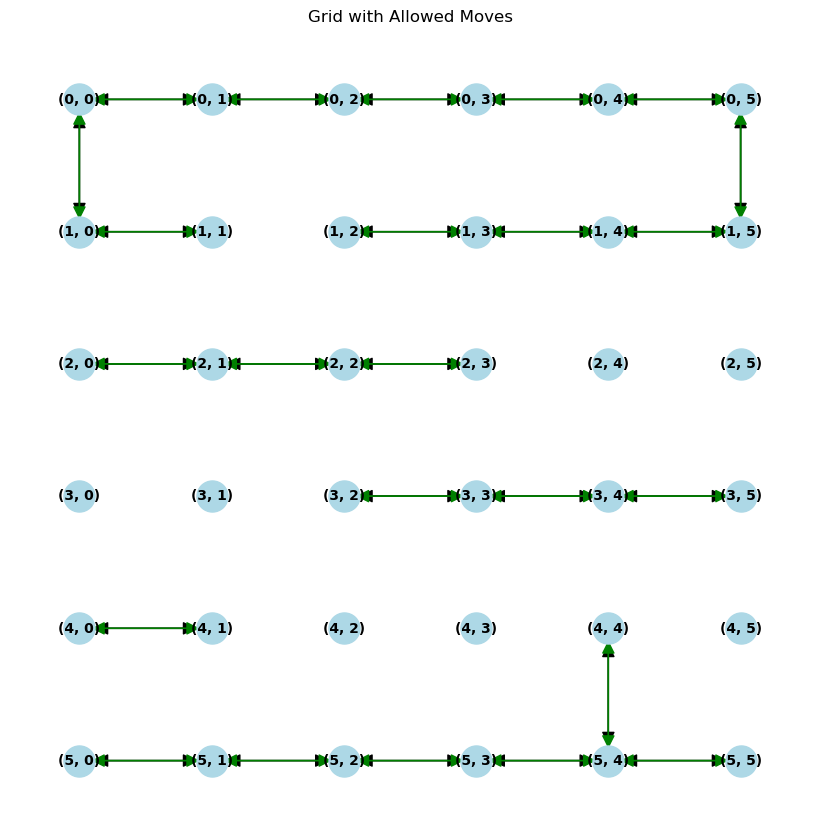

In [120]:
# illustrate which homographies were found
# green = full homography
# orange = translation only (full homography changes the size too much)
ScanStitcher.plot_grid_with_moves((6,6), graph_no_trans, homographies_type)

Searching for path between (0, 0) (0, 1)
[(0, 0), (0, 1)]
translation dist [0, 707]


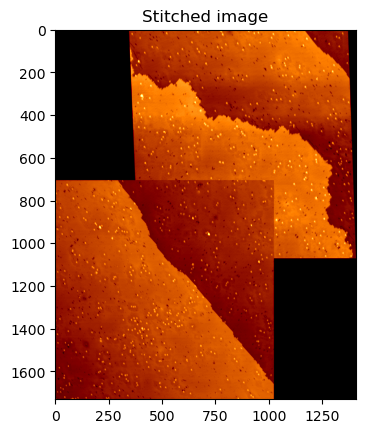

Resolution of image is 1408 by 1731
Searching for path between (0, 0) (0, 2)
[(0, 0), (0, 1), (0, 2)]
translation dist [0, 801]


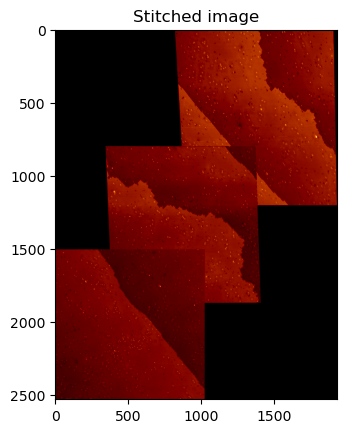

Resolution of image is 1929 by 2532
Searching for path between (0, 0) (0, 3)
[(0, 0), (0, 1), (0, 2), (0, 3)]
translation dist [0, 647]


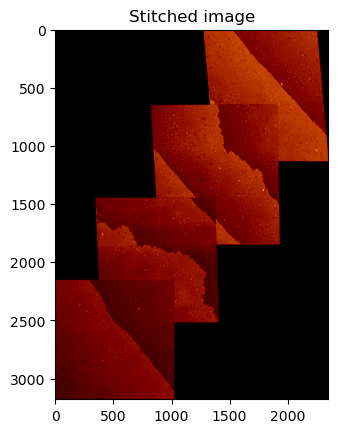

Resolution of image is 2349 by 3179
Searching for path between (0, 0) (0, 4)
[(0, 0), (0, 1), (0, 2), (0, 3), (0, 4)]
translation dist [0, 1207]


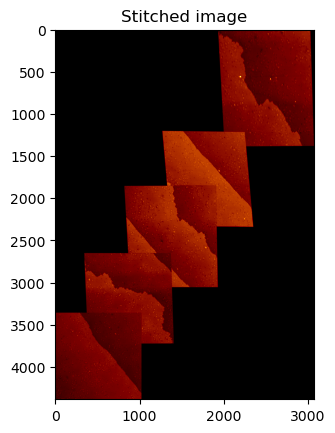

Resolution of image is 3067 by 4386
Searching for path between (0, 0) (0, 5)
[(0, 0), (0, 1), (0, 2), (0, 3), (0, 4), (0, 5)]
translation dist [0, 1660]


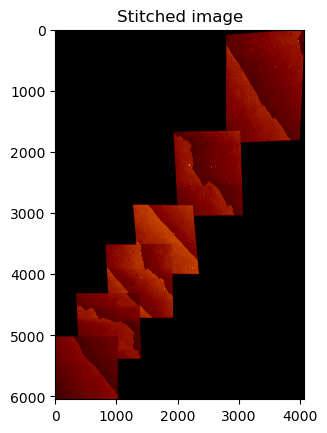

Resolution of image is 4077 by 6046
Searching for path between (0, 0) (1, 0)
[(0, 0), (1, 0)]
translation dist [0, 0]


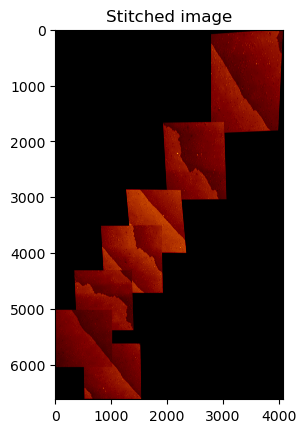

Resolution of image is 4077 by 6617
Searching for path between (0, 0) (1, 1)
[(0, 0), (1, 0), (1, 1)]
translation dist [0, 0]


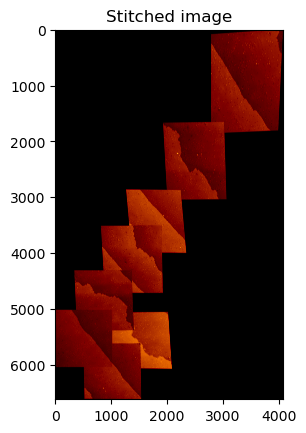

Resolution of image is 4077 by 6617
Searching for path between (0, 0) (1, 2)
[(0, 0), (0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (1, 5), (1, 4), (1, 3), (1, 2)]
translation dist [0, 0]


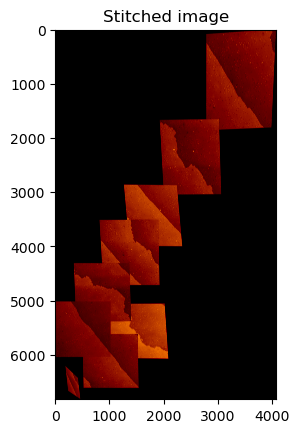

Resolution of image is 4077 by 6821
Searching for path between (0, 0) (1, 3)
[(0, 0), (0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (1, 5), (1, 4), (1, 3)]
translation dist [0, 0]


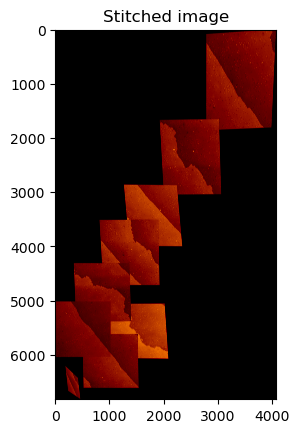

Resolution of image is 4077 by 6821
Searching for path between (0, 0) (1, 4)
[(0, 0), (0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (1, 5), (1, 4)]
translation dist [0, 0]


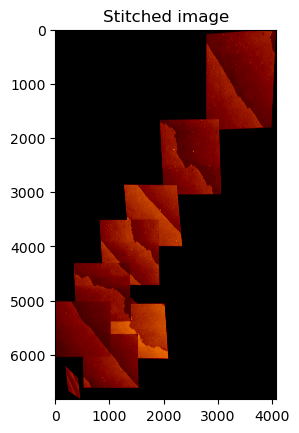

Resolution of image is 4077 by 6821
Searching for path between (0, 0) (1, 5)
[(0, 0), (0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (1, 5)]
translation dist [0, 0]


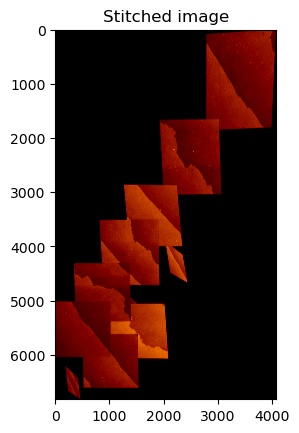

Resolution of image is 4077 by 6821
Searching for path between (0, 0) (2, 0)
No path found between (0, 0) (2, 0)
Searching for path between (0, 0) (2, 1)
No path found between (0, 0) (2, 1)
Searching for path between (0, 0) (2, 2)
No path found between (0, 0) (2, 2)
Searching for path between (0, 0) (2, 3)
No path found between (0, 0) (2, 3)
Searching for path between (0, 0) (2, 4)
No path found between (0, 0) (2, 4)
Searching for path between (0, 0) (2, 5)
No path found between (0, 0) (2, 5)
Searching for path between (0, 0) (3, 0)
No path found between (0, 0) (3, 0)
Searching for path between (0, 0) (3, 1)
No path found between (0, 0) (3, 1)
Searching for path between (0, 0) (3, 2)
No path found between (0, 0) (3, 2)
Searching for path between (0, 0) (3, 3)
No path found between (0, 0) (3, 3)
Searching for path between (0, 0) (3, 4)
No path found between (0, 0) (3, 4)
Searching for path between (0, 0) (3, 5)
No path found between (0, 0) (3, 5)
Searching for path between (0, 0) (4, 0)

In [121]:
# this function stitches the scans by using homographies that were calculated by 
# comparing one scan with its neighbours
stitched_scan = ScanStitcher.stitch_from_homographies(segmented_scans, homographies_no_trans, graph_no_trans, 14)

In [ ]:
# This function stitches the scans by comparing each scan with the current 'stitched scan'.
# i.e first and second scan are stitched, then third is stitched onto the stitched together first and second scan.
stitched_scan = ScanStitcher.stitch_scans(segmented_scans, show_plot=True, round_to = 10, counts1=4, counts2=10)